# Surface processing

This tutorial walks through the key steps involved in preparing laminar surfaces for MEG source reconstruction using laMEG. Starting from FreeSurfer outputs, we will generate multiple cortical layers, remove non-cortical vertices, merge hemispheres, downsample the meshes while preserving vertex correspondence, compute dipole orientations, and finally combine all layers into a single laminar surface model.

These operations are essential to obtain geometrically accurate, computationally efficient, and laminar-consistent source spaces.

***Create layer surfaces***

The first step is to generate a set of intermediate surfaces between the pial and white matter boundaries.

This step:
- Uses FreeSurfer's `mris_inflate` utility to iteratively create surfaces that are approximately equidistant between the white and pial boundaries.
- Maintains **vertex correspondence** across all layers: each vertex in the white surface is connected to its pial counterpart by a straight vector, and intermediate layer vertices lie along this line.
- Converts each generated surface to GIFTI format and adjusts its coordinates using the FreeSurfer RAS offset (CRAS), ensuring that surfaces are in native anatomical space.

The resulting surfaces represent an anatomically consistent sampling of the cortical ribbon.

In [ ]:
%matplotlib inline
%env SUBJECTS_DIR=../test_data/fs

In [3]:
import numpy as np
import k3d
import matplotlib.pyplot as plt
from lameg.surf import LayerSurfaceSet
from lameg.viz import show_surface, rgbtoint
from IPython.display import Image
import base64

surf_set = LayerSurfaceSet('sub-104', 11)
layer_names = surf_set.get_layer_names()

cam_view=[-143, 14, 31.5,
          -32, 22.5, 38.5,
          0, 0, 1]
col_r = plt.cm.cool(np.linspace(0,1, num=surf_set.n_layers))

plots = []
for l_idx,layer_name in enumerate(layer_names):
    plot = show_surface(
        surf_set, 
        layer_name=layer_name, 
        stage='converted', 
        hemi='lh', 
        plot_curvature=False,
        camera_view=cam_view, 
        color=col_r[l_idx,:3]*255, 
        height=256
    )
    plots.append(plot)

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

In [4]:
for plot in plots:
    plot.fetch_screenshot()

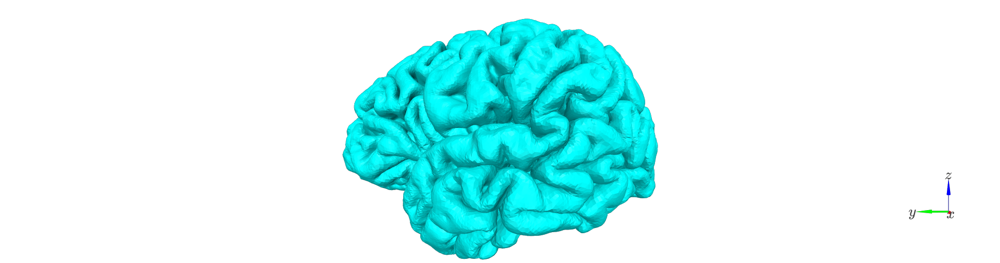

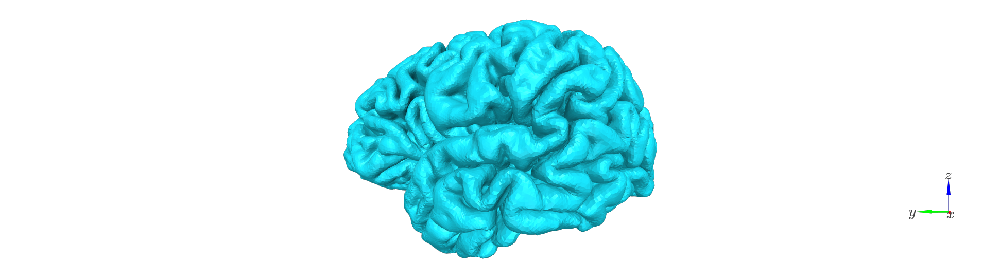

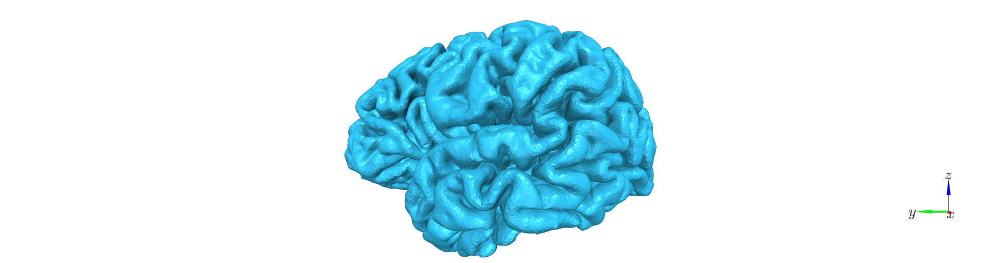

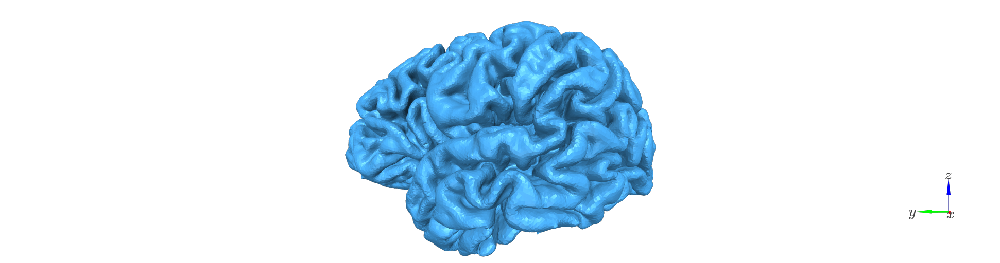

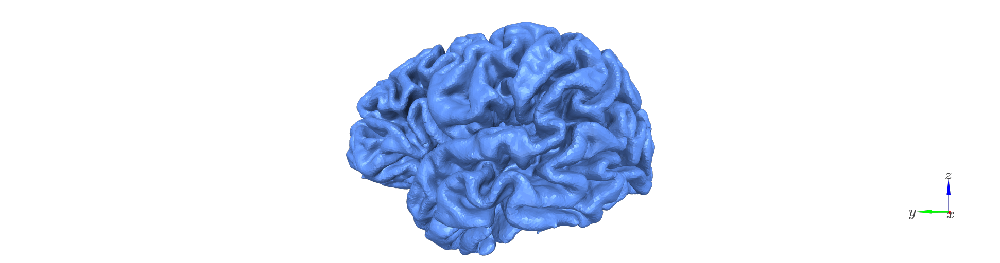

...

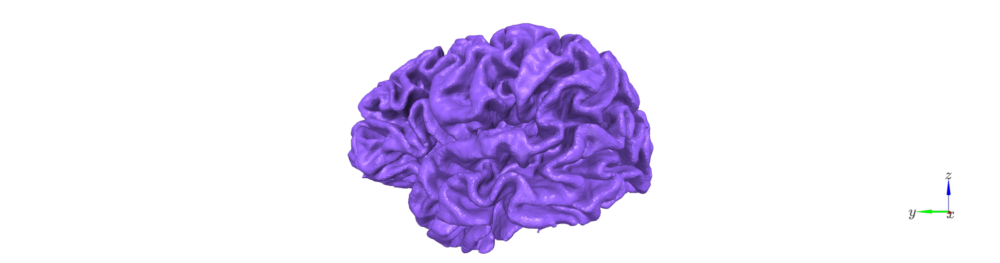

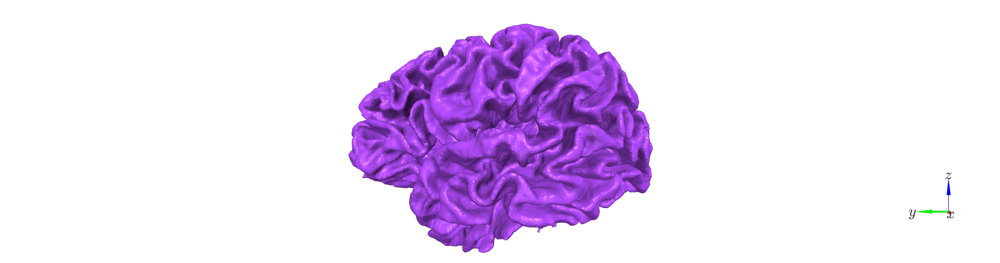

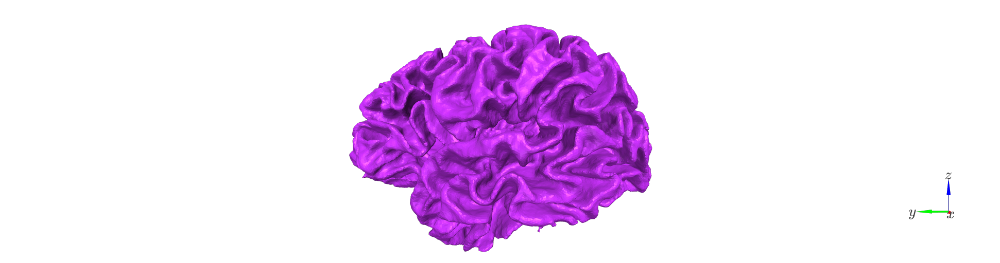

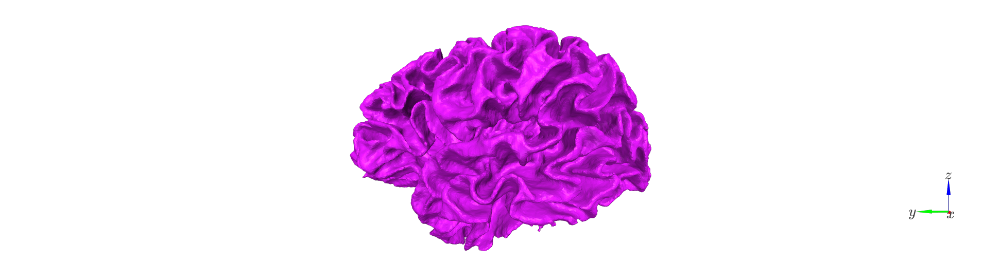

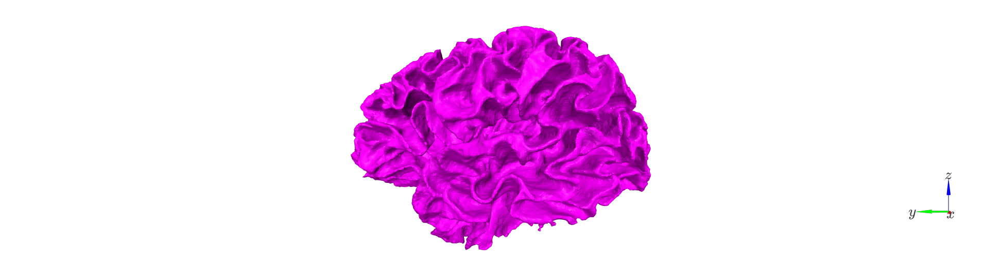

In [7]:
for plot in plots:
    display(Image(data=base64.b64decode(plot.screenshot)))

***Remove deep vertices***

FreeSurfer surfaces include vertices that extend into deep structures (e.g., the corpus callosum), which are not part of the cortical source space.

This step removes those deep vertices and any associated faces by:
- Identifying vertices not assigned to a cortical label in the Desikan-Killiany atlas.
- Removing vertices labeled as "unknown".
- Applying this filtering independently to each hemisphere and each layer.

The resulting surfaces strictly represent cortical gray matter.

**Before:** deep vertices are visible within subcortical regions.

In [8]:
cam_view=[110, 18, 36,
          -32, 22, 42,
          0, 0, 1]
plot = show_surface(
    surf_set, 
    layer_name='pial', 
    stage='converted', 
    hemi='lh', 
    plot_curvature=False,
    camera_view=cam_view, 
    color=col_r[0,:3]*255
)

Output()

In [9]:
plot.fetch_screenshot()

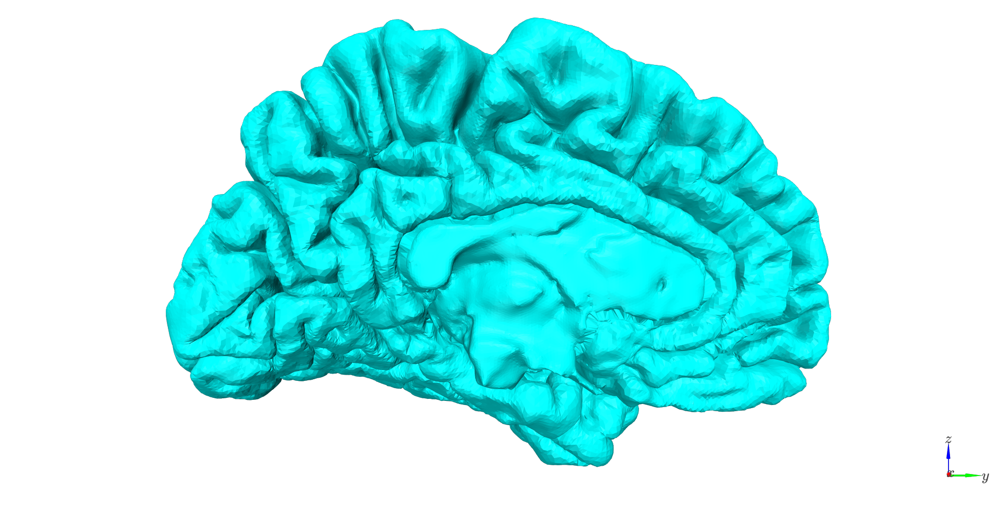

In [10]:
Image(data=base64.b64decode(plot.screenshot))

**After:** deep vertices are removed, leaving only cortical surfaces.

In [11]:
plot = show_surface(
    surf_set, 
    layer_name='pial',
    stage='nodeep',
    hemi='lh',
    plot_curvature=False,
    camera_view=cam_view, 
    color=col_r[0,:3]*255
)

Output()

In [12]:
plot.fetch_screenshot()

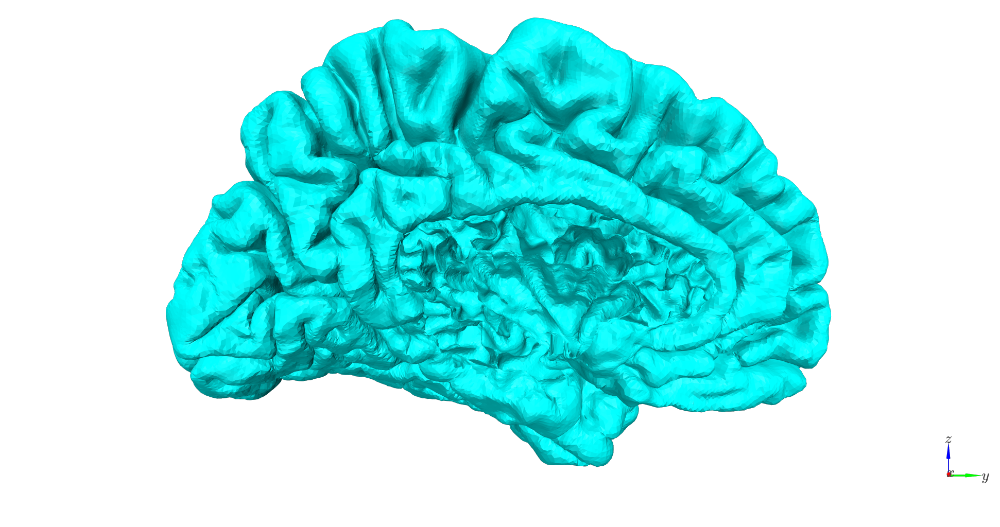

In [13]:
Image(data=base64.b64decode(plot.screenshot))

***Combine hemispheres***

FreeSurfer outputs the left and right hemispheres separately. To facilitate visualization and later source modeling, we merge them into a single mesh.

This step:
- Concatenates vertex and face arrays (left first, then right).
- Does not introduce any new faces - hemispheres remain disconnected but stored together.
- Is applied independently to each cortical layer.

In [14]:
cam_view=[13, 64, 217,
          21, 21, 33,
          0, 1, 0]
plot = show_surface(
    surf_set, 
    layer_name='pial',
    stage='combined',
    plot_curvature=False,
    camera_view=cam_view, 
    color=col_r[0,:3]*255
)

Output()

In [15]:
plot.fetch_screenshot()

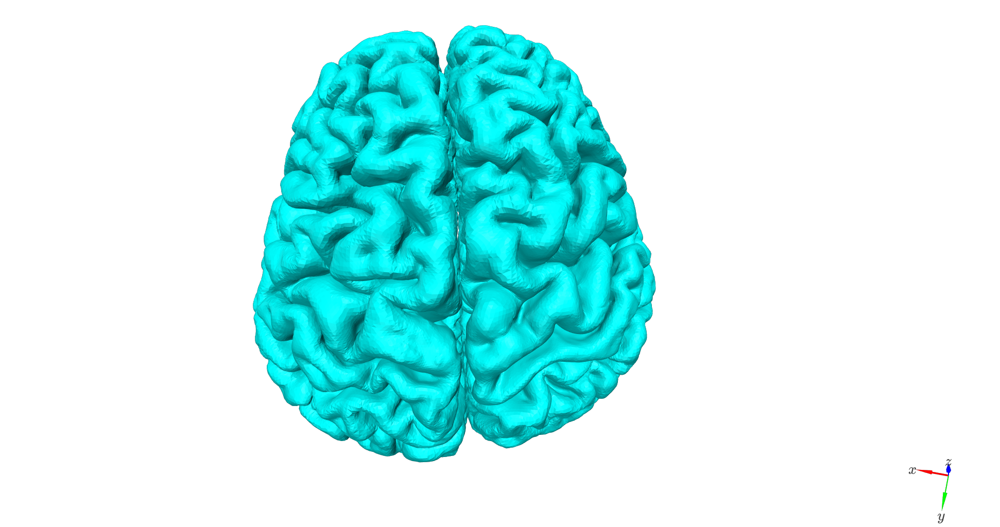

In [16]:
Image(data=base64.b64decode(plot.screenshot))

***Downsample***

The original FreeSurfer meshes contain hundreds of thousands of vertices - far too dense for efficient source inversion. We therefore downsample the mesh while preserving **vertex correspondence** across layers (see [Bonaiuto et al. 2020, Estimates of cortical column orientation improve MEG source inversion](https://doi.org/10.1016/j.neuroimage.2020.116862)).

To achieve this:
- The pial surface is downsampled using VTK's `DecimatePro` algorithm, which *removes* vertices rather than creating new ones.
- The same vertex indices are then removed from every other layer to maintain correspondence.
- The face structure from the downsampled pial surface is propagated to other layers.

This ensures that each vertex index corresponds to the same cortical column across depth.

In [17]:
plot = show_surface(
    surf_set, 
    layer_name='pial',
    stage='ds',
    plot_curvature=False,
    camera_view=cam_view, 
    color=col_r[0,:3]*255
)

Output()

In [18]:
plot.fetch_screenshot()

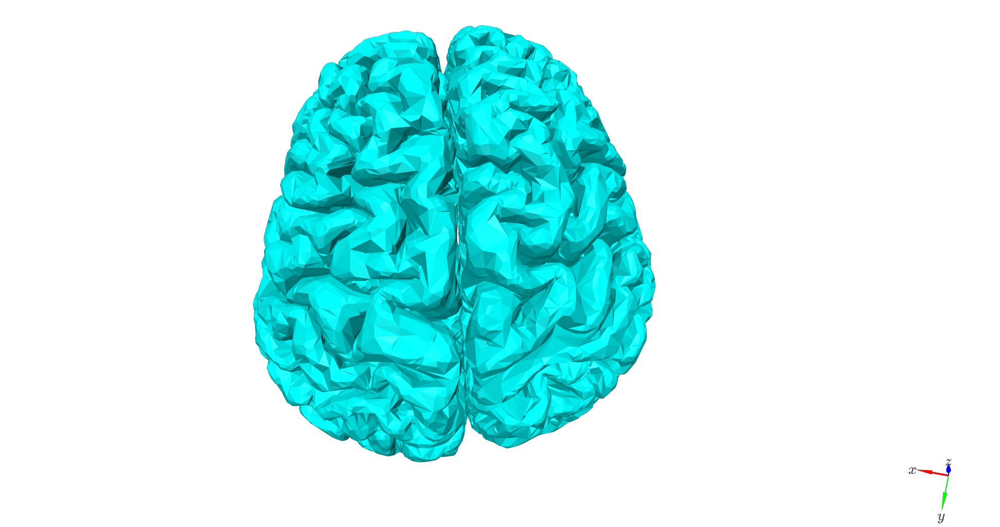

In [19]:
Image(data=base64.b64decode(plot.screenshot))

***Compute link vectors***

Dipole orientation is crucial for laminar source inversion. Here we compute **link vectors** - orientation vectors connecting corresponding vertices between pial and white matter surfaces.

Other options include:
- Downsampled surface normals
- Original surface normals
- Cortical patch statistics

These other options three compute vertex normals based on the orientation of the surrounding faces. They can be either computed separately for each layer, or the pial surface orientations can be used for all layers.

Link vectors (as used here) are generally preferred, as they are stable across layers and align closely with the predominant orientation of cortical columns (see [Bonaiuto et al. 2020, Estimates of cortical column orientation improve MEG source inversion](https://doi.org/10.1016/j.neuroimage.2020.116862)). These vectors are stored in the `normals` attribute of each GIFTI surface.

In [20]:
plot = k3d.plot(
    grid_visible=False, menu_visibility=False, camera_auto_fit=False
)
pial_surf = surf_set.load(layer_name='pial', stage='ds', orientation='link_vector', fixed=True)
pial_vertices, pial_faces, _ = pial_surf.agg_data()

white_surf = surf_set.load(layer_name='white', stage='ds', orientation='link_vector', fixed=True)
white_vertices, white_faces, _ = white_surf.agg_data()

cam_view=[70, 40.5, 76.5,
          22.5, 26, 73.5,
          0, 0, 1]

pial_mesh = k3d.mesh(pial_vertices, pial_faces, side="double", color=int(rgbtoint(col_r[0,:3]*255)), opacity=0.5)
plot += pial_mesh

white_mesh = k3d.mesh(white_vertices, white_faces, side="double", color=int(rgbtoint(col_r[-1,:3]*255)), opacity=1)
plot += white_mesh

dipole_vectors = k3d.vectors(
    white_vertices,
    vectors=pial_vertices - white_vertices,
    head_size=5,
    line_width=0.1
)
plot += dipole_vectors

plot.camera=cam_view

plot.display()

Output()

In [21]:
plot.fetch_screenshot()

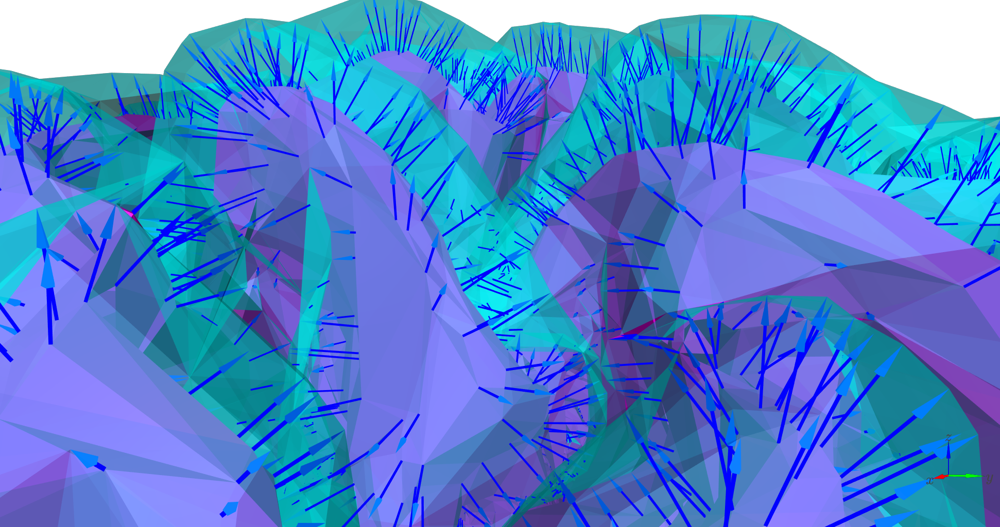

In [22]:
Image(data=base64.b64decode(plot.screenshot))

***Combine layers***

Finally, all layers are merged into a single structure by concatenating their vertices and faces (from pial to white matter). No inter-layer connections are created.

The resulting surface set provides a compact representation of the cortical ribbon, where each vertex index corresponds to a single cortical column sampled at multiple depths.

In [23]:
plot = k3d.plot(
    grid_visible=False, menu_visibility=False, camera_auto_fit=False
)

for l_idx,layer_name in enumerate(layer_names):
    surface = surf_set.load(layer_name=layer_name, stage='ds')
    vertices, faces = surface.agg_data()
    
    mesh = k3d.mesh(vertices, faces, side="double", color=int(rgbtoint(col_r[l_idx,:3]*255)), opacity=l_idx/(surf_set.n_layers-1))
    plot += mesh
    
plot.camera=cam_view

plot.display()

Output()

In [24]:
plot.fetch_screenshot()

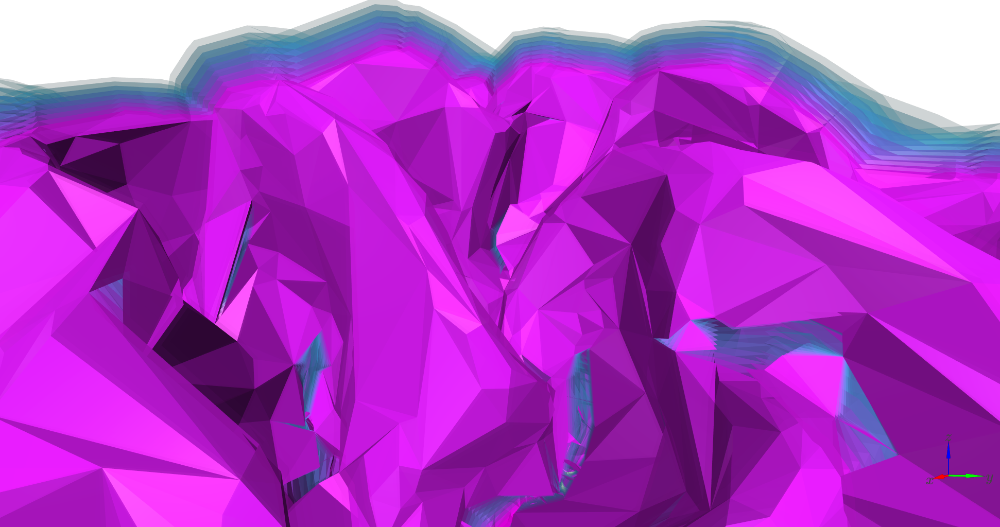

In [25]:
Image(data=base64.b64decode(plot.screenshot))

# Putting it all together

All the above steps - surface inflation, deep vertex removal, hemisphere merging, downsampling, and orientation computation - can be performed automatically using:

```python
from lameg.surf import LayerSurfaceSet

surf_set = LayerSurfaceSet('sub-104', n_layers=11)
surf_set.create(
    ds_factor=0.1,
    orientation='link_vector',
    fixed=True
)
```

This function allows flexible specification of the number of intermediate layers, downsampling ratio, and dipole orientation model.

In [10]:
# Create a 2-layer surface (only pial and white)
surf_set = LayerSurfaceSet('sub-104', 2)
surf_set.create(
    ds_factor=0.1,                                 
    orientation='link_vector'
)

[ 2.02536 36.9153  16.8828 ]
Saving ../test_data/sub-104/surf/lh.pial.gii as a surface
Saving ../test_data/sub-104/surf/rh.pial.gii as a surface
Saving ../test_data/sub-104/surf/lh.white.gii as a surface
Saving ../test_data/sub-104/surf/rh.white.gii as a surface
Saving ../test_data/sub-104/surf/lh.inflated.gii as a surface
Saving ../test_data/sub-104/surf/rh.inflated.gii as a surface
100.0% of the vertices in the decimated surface belong to the original surface.


In [11]:
# Create an 11-layer surface
surf_set = LayerSurfaceSet('sub-104', 11)
surf_set.create(
    ds_factor=0.1, 
    orientation='link_vector'
)

using distance as a % of thickness
expanding surface ../test_data/fs/sub-104/surf/lh.white by 90.0% of thickness and writing it to ../test_data/fs/sub-104/surf/lh.0.900
reading thickness...
using distance as a % of thickness
expanding surface ../test_data/fs/sub-104/surf/lh.white by 70.0% of thickness and writing it to ../test_data/fs/sub-104/surf/lh.0.700
reading thickness...
using distance as a % of thickness
expanding surface ../test_data/fs/sub-104/surf/lh.white by 40.0% of thickness and writing it to ../test_data/fs/sub-104/surf/lh.0.400
reading thickness...
using distance as a % of thickness
expanding surface ../test_data/fs/sub-104/surf/lh.white by 30.0% of thickness and writing it to ../test_data/fs/sub-104/surf/lh.0.300
reading thickness...
using distance as a % of thickness
expanding surface ../test_data/fs/sub-104/surf/lh.white by 80.0% of thickness and writing it to ../test_data/fs/sub-104/surf/lh.0.800
reading thickness...
using distance as a % of thickness
expanding surfa

Saving ../test_data/sub-104/surf/rh.0.700.gii as a surface
Saving ../test_data/sub-104/surf/lh.0.600.gii as a surface
Saving ../test_data/sub-104/surf/rh.0.600.gii as a surface
Saving ../test_data/sub-104/surf/lh.0.500.gii as a surface
Saving ../test_data/sub-104/surf/rh.0.500.gii as a surface
Saving ../test_data/sub-104/surf/lh.0.400.gii as a surface
Saving ../test_data/sub-104/surf/rh.0.400.gii as a surface
Saving ../test_data/sub-104/surf/lh.0.300.gii as a surface
Saving ../test_data/sub-104/surf/rh.0.300.gii as a surface
Saving ../test_data/sub-104/surf/lh.0.200.gii as a surface
Saving ../test_data/sub-104/surf/rh.0.200.gii as a surface
Saving ../test_data/sub-104/surf/lh.0.100.gii as a surface
Saving ../test_data/sub-104/surf/rh.0.100.gii as a surface
Saving ../test_data/sub-104/surf/lh.white.gii as a surface
Saving ../test_data/sub-104/surf/rh.white.gii as a surface
Saving ../test_data/sub-104/surf/lh.inflated.gii as a surface
Saving ../test_data/sub-104/surf/rh.inflated.gii as a

In [12]:
# Create a 15-layer surface
surf_set = LayerSurfaceSet('sub-104', 15)
surf_set.create(
    ds_factor=0.1, 
    orientation='link_vector'
)

using distance as a % of thickness
expanding surface ../test_data/fs/sub-104/surf/lh.white by 92.9% of thickness and writing it to ../test_data/fs/sub-104/surf/lh.0.929
reading thickness...
using distance as a % of thickness
expanding surface ../test_data/fs/sub-104/surf/lh.white by 35.7% of thickness and writing it to ../test_data/fs/sub-104/surf/lh.0.357
reading thickness...
using distance as a % of thickness
expanding surface ../test_data/fs/sub-104/surf/lh.white by 57.1% of thickness and writing it to ../test_data/fs/sub-104/surf/lh.0.571
reading thickness...
using distance as a % of thickness
expanding surface ../test_data/fs/sub-104/surf/lh.white by 85.7% of thickness and writing it to ../test_data/fs/sub-104/surf/lh.0.857
reading thickness...
using distance as a % of thickness
expanding surface ../test_data/fs/sub-104/surf/lh.white by 71.4% of thickness and writing it to ../test_data/fs/sub-104/surf/lh.0.714
reading thickness...
using distance as a % of thickness
expanding surfa

step 37 of 342      
writing expanded surface to ../test_data/fs/sub-104/surf/rh.0.429...
surface expansion took 15 minutes and 22 seconds.
step 145 of 276     -01: dt=0.0000, 0 negative triangles
ending sse = 9976.720387
nrounds = 6
step 204 of 276     
writing expanded surface to ../test_data/fs/sub-104/surf/lh.0.857...
surface expansion took 36 minutes and 10 seconds.
step 162 of 306     using distance as a % of thickness
expanding surface ../test_data/fs/sub-104/surf/rh.white by 85.7% of thickness and writing it to ../test_data/fs/sub-104/surf/rh.0.857
reading thickness...
step 229 of 276     -01: dt=0.0000, 0 negative triangles
ending sse = 9976.720387
nrounds = 6
step 125 of 378     
writing expanded surface to ../test_data/fs/sub-104/surf/rh.0.571...
surface expansion took 21 minutes and 45 seconds.
step 83 of 414      
writing expanded surface to ../test_data/fs/sub-104/surf/lh.0.929...
surface expansion took 45 minutes and 38 seconds.
step 223 of 342     using distance as a % 